# **Price Elasticity of Demand Analysis Project**

Welcome to the Price Elasticity of Demand (PED) Analysis Project! This project explores how price changes affect the quantity demanded of items across various stores, providing insights into price sensitivity and consumer behavior. Below is a structured roadmap of the project, guiding you through each analysis step to uncover actionable insights.

---

## **Table of Contents**

1. [Data Understanding and Preparation](#data-understanding-and-preparation)
    - Dataset Overview
    - Data Cleaning and Inspection
    - Feature Engineering
2. [Exploratory Data Analysis (EDA)](#exploratory-data-analysis-eda)
    - Item-Level Trend Analysis
    - Store Performance Insights
    - Data Visualizations
3. [Price Elasticity of Demand (PED) Calculation](#price-elasticity-of-demand-ped-calculation)
    - PED Calculation
    - Weighted PED
    - Summary Statistics
4. [Segmentation Analysis](#segmentation-analysis)
    - Elasticity Segmentation
    - Dynamic Segmentation
5. [Time Series and Trend Analysis](#time-series-and-trend-analysis)
    - PED Analysis by Fiscal Week
    - Trends Over Time
6. [Statistical Analysis](#statistical-analysis)
    - Regression Analysis
    - ANOVA and T-Tests
7. [Simulated Pricing Strategies](#simulated-pricing-strategies)
    - Simulating Price Changes
    - Hypothetical Scenario Analysis
8. [Competitive Analysis](#competitive-analysis)
    - Price Sensitivity Relative to Competition

---

## **1. Data Understanding and Preparation**

### **Dataset Overview**
- **Explanation**: Begin by loading the dataset to understand its structure and contents. This includes columns like `Store_ID`, `Item_ID`, `Price`, `Item_Quantity`, and more.
- **Code Snippet**: `data = pd.read_csv('Competition_Data.csv')` to load the dataset.
- **Impact of Skipping**: Without loading and inspecting the data, the analysis may be based on incomplete or incorrect data.

### **Data Cleaning and Inspection**
- **Why It’s Necessary**: Inspect data types and missing values to ensure accurate analysis.
- **Code Snippets**: 
  - `print(data.dtypes)` to check data types.
  - `data.isnull().sum()` to identify missing values.
- **Impact of Skipping**: Missing or incorrectly typed data can lead to erroneous results in further analysis.

### **Feature Engineering**
- **Explanation**: Create new features like `Price_Change` and `Quantity_Change` to calculate the percentage changes in price and quantity sold.
- **Code Snippet**: 
  - `data['Price_Change'] = data.groupby(['Store_ID', 'Item_ID'])['Price'].pct_change()`
  - `data['Quantity_Change'] = data.groupby(['Store_ID', 'Item_ID'])['Item_Quantity'].pct_change()`
- **Impact of Skipping**: Without these features, calculations for price elasticity cannot be performed.

---

## **2. Exploratory Data Analysis (EDA)**

### **Item-Level Trend Analysis**
- **Explanation**: Visualize sales trends for each item to understand the impact of time on quantity sold.
- **Code Snippet**: 
  - Use `plt.plot()` for visualizing trends for each `Item_ID`.
- **Impact of Skipping**: Not analyzing individual items might result in missing important trends and sales behaviors.

### **Store Performance Insights**
- **Explanation**: Understand how different stores perform by visualizing item quantity distribution.
- **Code Snippet**: 
  - `sns.boxplot(x='Store_ID', y='Item_Quantity', data=data)`
- **Impact of Skipping**: Ignoring store-specific trends may overlook valuable insights on store performance.

### **Data Visualizations**
- **Explanation**: Visualize the distributions of `Price` and `Item_Quantity` to understand their spread and behavior.
- **Code Snippets**: 
  - `sns.histplot(data['Price'], bins=30, kde=True)`
  - `sns.histplot(data['Item_Quantity'], bins=30, kde=True)`
- **Impact of Skipping**: Missing visual insights could lead to overlooking key trends in pricing and sales.

---

## **3. Price Elasticity of Demand (PED) Calculation**

### **PED Calculation**
- **Explanation**: Calculate the Price Elasticity of Demand using the percentage changes in price and quantity.
- **Code Snippet**: 
  - `data['PED'] = data['Quantity_Change'] / data['Price_Change']`
- **Impact of Skipping**: Without PED, you cannot measure how sensitive demand is to price changes.

### **Weighted PED**
- **Explanation**: Calculate weighted PED by factoring in item quantity to prioritize more significant data points.
- **Code Snippet**: 
  - `data['Weighted_PED'] = data['PED'] * data['Item_Quantity'] / data['Item_Quantity'].sum()`
- **Impact of Skipping**: Weighted PED provides more accurate insights by giving importance to larger data points.

### **Summary Statistics**
- **Explanation**: Summarize the PED values to understand the distribution of price elasticity across the dataset.
- **Code Snippet**: 
  - `ped_summary = data['PED'].describe()`
- **Impact of Skipping**: Without a summary, understanding the range and central tendency of PED is impossible.

---

## **4. Segmentation Analysis**

### **Elasticity Segmentation**
- **Explanation**: Segment data into different categories based on elasticity (e.g., Highly Elastic, Inelastic).
- **Code Snippet**: 
  - `data['Segment'] = 'Unitary Elastic'`
- **Impact of Skipping**: Without segmentation, meaningful patterns within various elasticities are hard to interpret.

### **Dynamic Segmentation**
- **Explanation**: Use dynamic quantile thresholds to categorize elasticity for more granular insights.
- **Code Snippet**: 
  - `data['Dynamic_Segment'] = pd.cut(data['PED'], bins=[-float('inf'), inelastic_threshold, q1, elastic_threshold, float('inf')])`
- **Impact of Skipping**: Dynamic segmentation allows deeper insights by adjusting based on data distribution.

---

## **5. Time Series and Trend Analysis**

### **PED Analysis by Fiscal Week**
- **Explanation**: Analyze how elasticity changes over time by grouping the data by `Fiscal_Week_ID`.
- **Code Snippet**: 
  - `weekly_ped = data.groupby('Fiscal_Week_ID')['PED'].mean().reset_index()`
- **Impact of Skipping**: Temporal trends in PED would remain overlooked, missing crucial time-based insights.

### **Trends Over Time**
- **Explanation**: Visualize the changes in PED over time to identify temporal patterns.
- **Code Snippet**: 
  - `plt.plot(weekly_ped['Fiscal_Week_ID'], weekly_ped['PED'], marker='o')`
- **Impact of Skipping**: Temporal analysis helps understand long-term trends and seasonal effects on elasticity.

---

## **6. Statistical Analysis**

### **Regression Analysis**
- **Explanation**: Use regression analysis to understand the relationship between price, competition price, and quantity sold.
- **Code Snippet**: 
  - `model = sm.OLS(y, X).fit()`
- **Impact of Skipping**: Regression analysis helps quantify the effects of price and competitor price on sales, which is crucial for strategy formulation.

### **ANOVA and T-Tests**
- **Explanation**: Perform statistical tests to compare PED across different segments and check for significant differences.
- **Code Snippet**: 
  - `anova_results = stats.f_oneway(*segment_data)`
- **Impact of Skipping**: Statistical tests provide confirmation of differences between segments, improving the reliability of insights.

---

## **7. Simulated Pricing Strategies**

### **Simulating Price Changes**
- **Explanation**: Simulate how different pricing strategies affect quantity sold based on PED.
- **Code Snippet**: 
  - `data['Simulated_Quantity'] = data['Item_Quantity'] * (1 + (data['PED'] * 0.10))`
- **Impact of Skipping**: Simulations allow businesses to test hypothetical pricing scenarios before implementing changes.

### **Hypothetical Scenario Analysis**
- **Explanation**: Compare simulated quantities to actual quantities sold to understand potential pricing impacts.
- **Code Snippet**: 
  - `plt.scatter(data['Item_Quantity'], data['Simulated_Quantity'])`
- **Impact of Skipping**: Missing scenario analysis can lead to suboptimal pricing decisions.

---

## **8. Competitive Analysis**

### **Price Sensitivity Relative to Competition**
- **Explanation**: Analyze how competition prices affect the demand for your items, offering insights into competitive pricing strategies.
- **Code Snippet**: 
  - `plt.hexbin(data['Competition_Price'], data['Item_Quantity'], gridsize=30, cmap='Blues')`
- **Impact of Skipping**: Understanding competition allows for better pricing strategy alignment with market conditions.

---

This roadmap provides a structured approach to analyzing price elasticity of demand across various segments and time periods. Each step involves necessary analyses that will guide the formulation of pricing strategies and insights into consumer behavior.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import statsmodels.api as sm
from scipy import stats
import seaborn as sns
sns.set(style="whitegrid")

In [2]:
# Load the dataset
data = pd.read_csv('Competition_Data.csv')
print(data.head())

   Index Fiscal_Week_ID   Store_ID   Item_ID   Price  Item_Quantity  \
0      0        2019-11  store_459  item_526  134.49            435   
1      1        2019-11  store_459  item_526  134.49            435   
2      2        2019-11  store_459  item_526  134.49            435   
3      3        2019-11  store_459  item_526  134.49            435   
4      4        2019-11  store_459  item_526  134.49            435   

   Sales_Amount_No_Discount  Sales_Amount  Competition_Price  
0                   4716.74      11272.59             206.44  
1                   4716.74      11272.59             158.01  
2                   4716.74      11272.59             278.03  
3                   4716.74      11272.59             222.66  
4                   4716.74      11272.59             195.32  


In [3]:
print(data.dtypes)

Index                         int64
Fiscal_Week_ID               object
Store_ID                     object
Item_ID                      object
Price                       float64
Item_Quantity                 int64
Sales_Amount_No_Discount    float64
Sales_Amount                float64
Competition_Price           float64
dtype: object


In [4]:
data.isnull().sum()

Index                       0
Fiscal_Week_ID              0
Store_ID                    0
Item_ID                     0
Price                       0
Item_Quantity               0
Sales_Amount_No_Discount    0
Sales_Amount                0
Competition_Price           0
dtype: int64

In [5]:
# Feature Engineering: Calculate percentage changes
data['Price_Change'] = data.groupby(['Store_ID', 'Item_ID'])['Price'].pct_change()
data['Quantity_Change'] = data.groupby(['Store_ID', 'Item_ID'])['Item_Quantity'].pct_change()

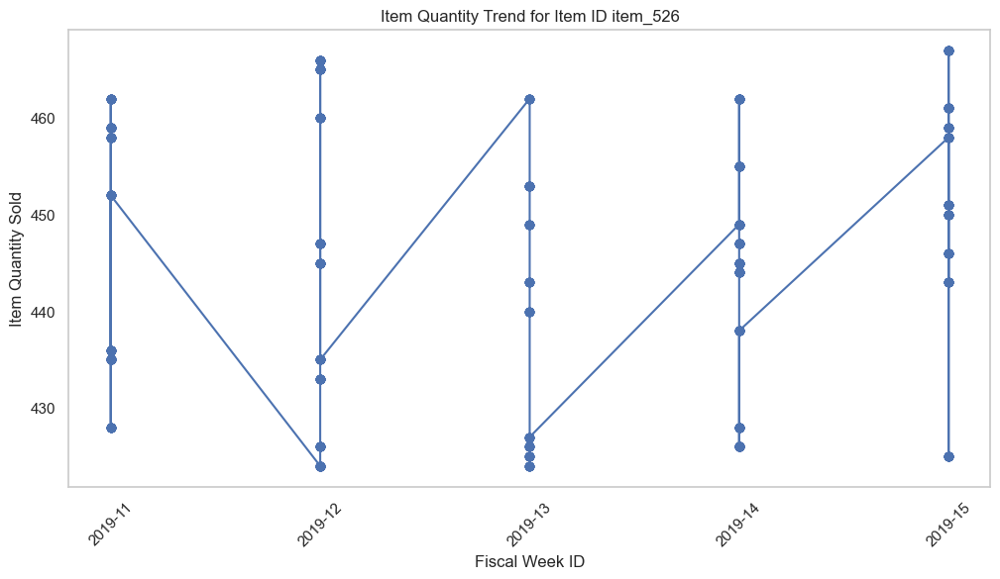

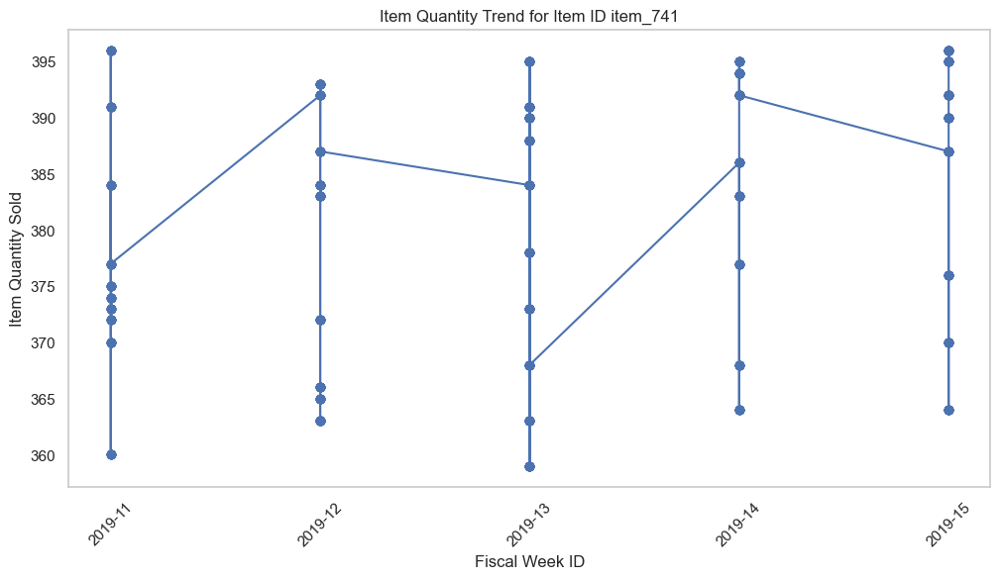

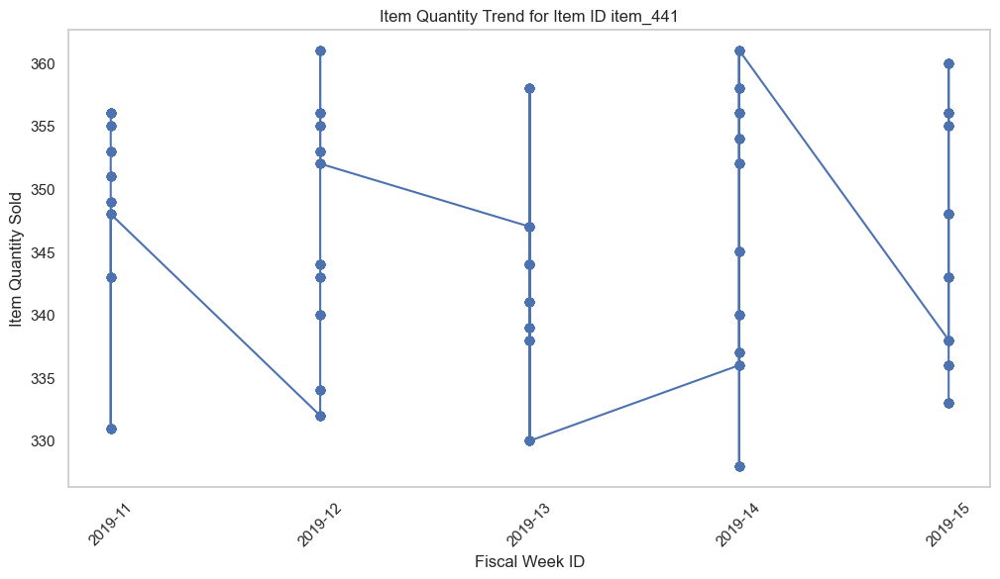

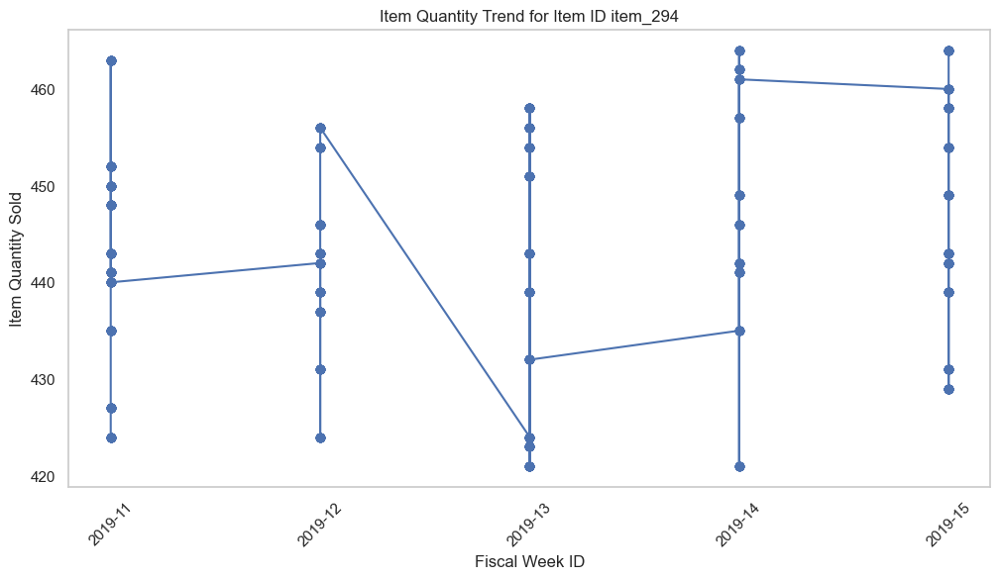

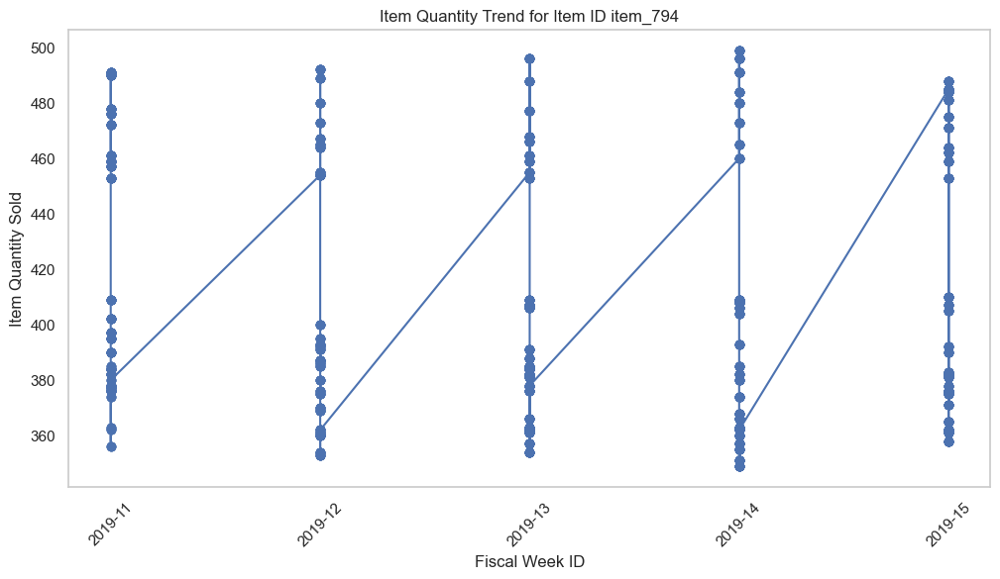

...

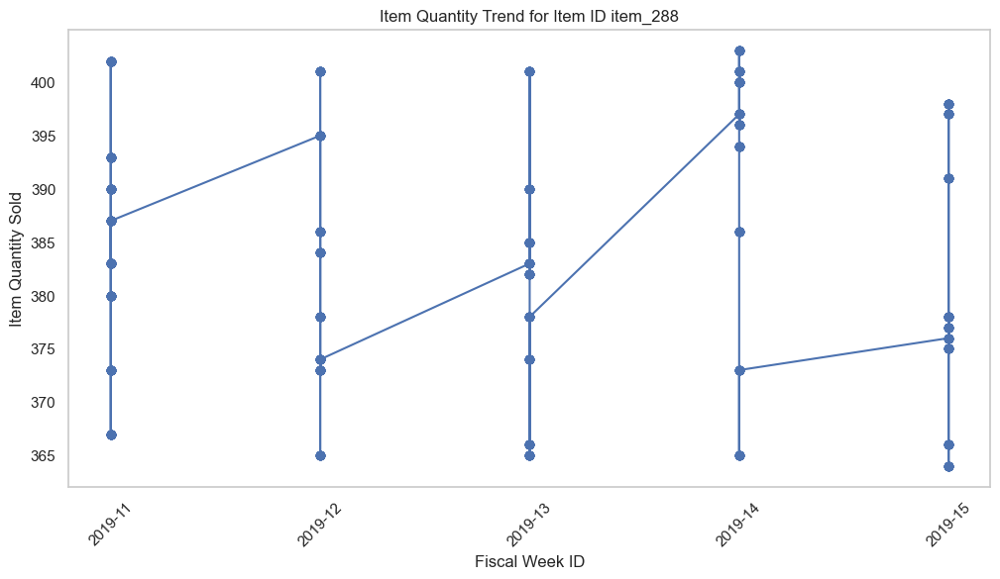

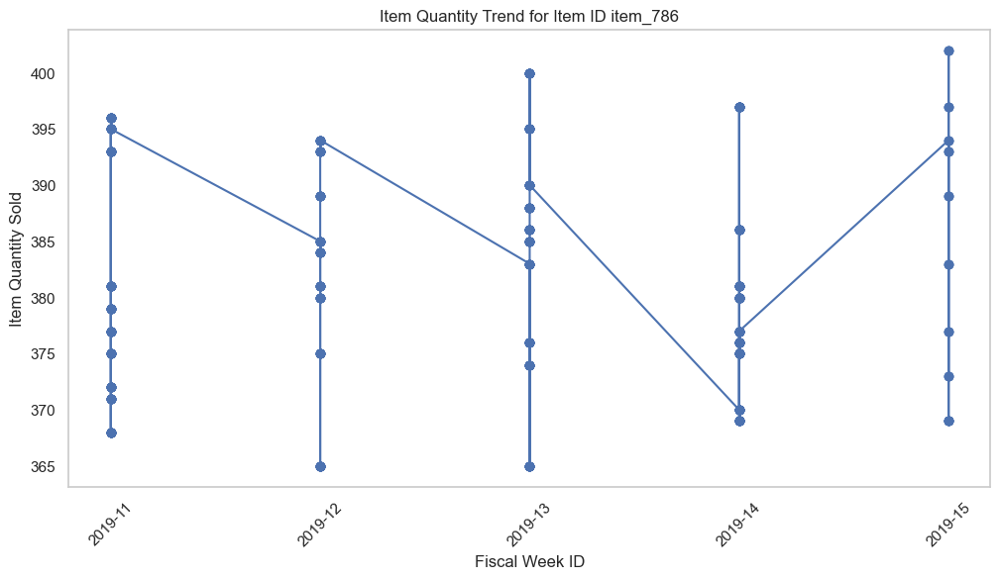

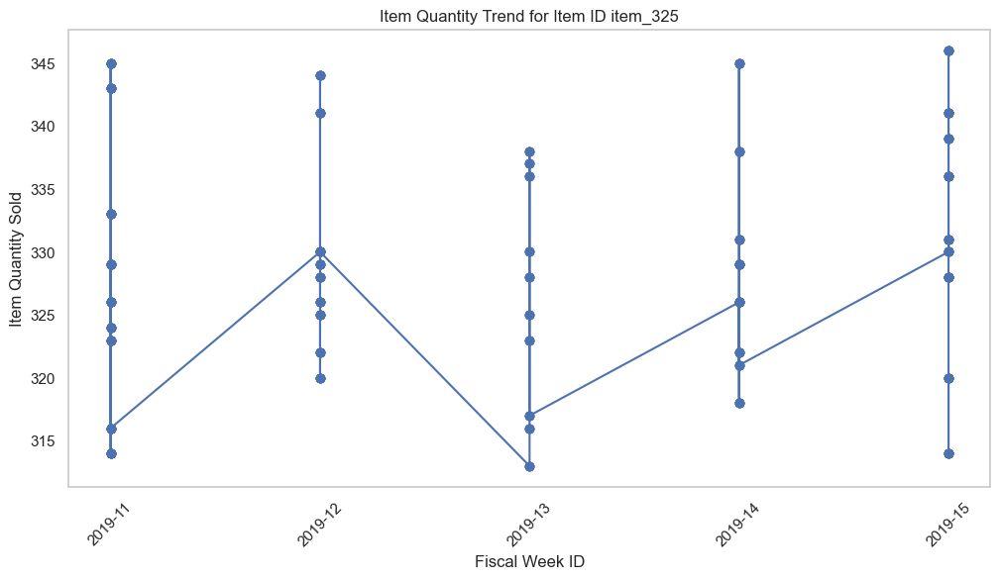

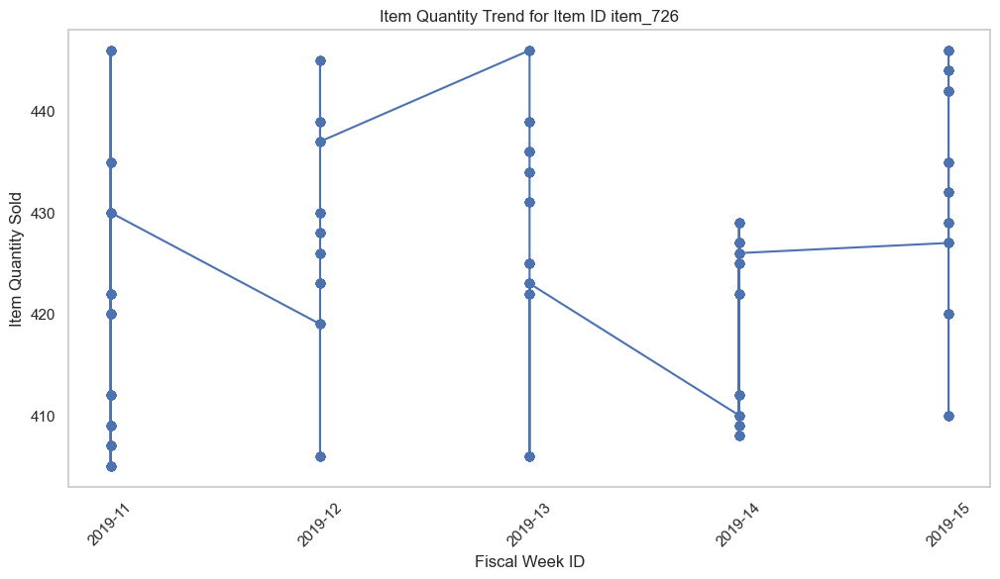

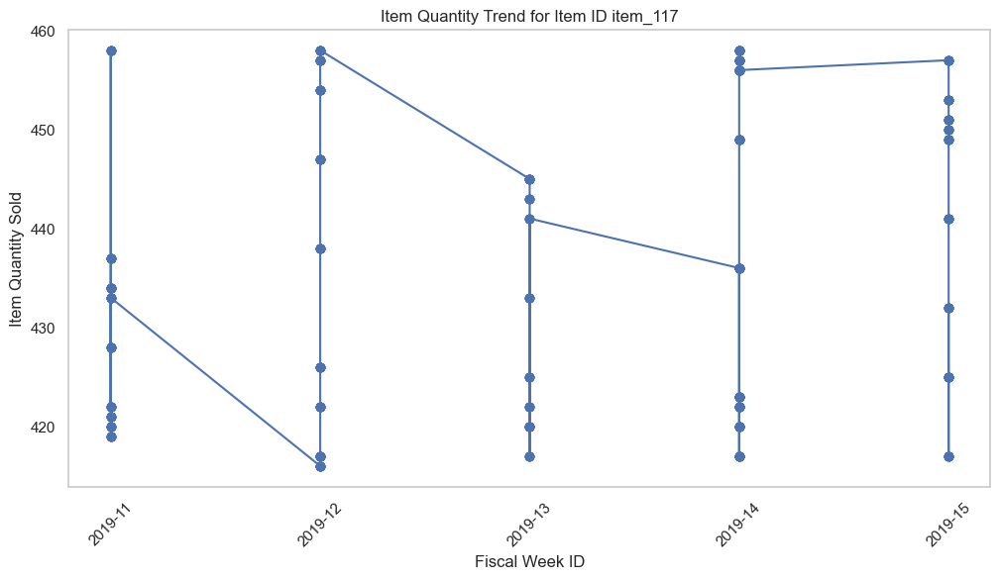

In [6]:
# Detailed Item Analysis: Analyze trends for each Item_ID
for item in data['Item_ID'].unique():
    item_data = data[data['Item_ID'] == item]
    plt.figure(figsize=(12, 6))
    plt.plot(item_data['Fiscal_Week_ID'], item_data['Item_Quantity'], marker='o')
    plt.title(f'Item Quantity Trend for Item ID {item}')
    plt.xlabel('Fiscal Week ID')
    plt.ylabel('Item Quantity Sold')
    plt.xticks(rotation=45)
    plt.grid()
    plt.show()

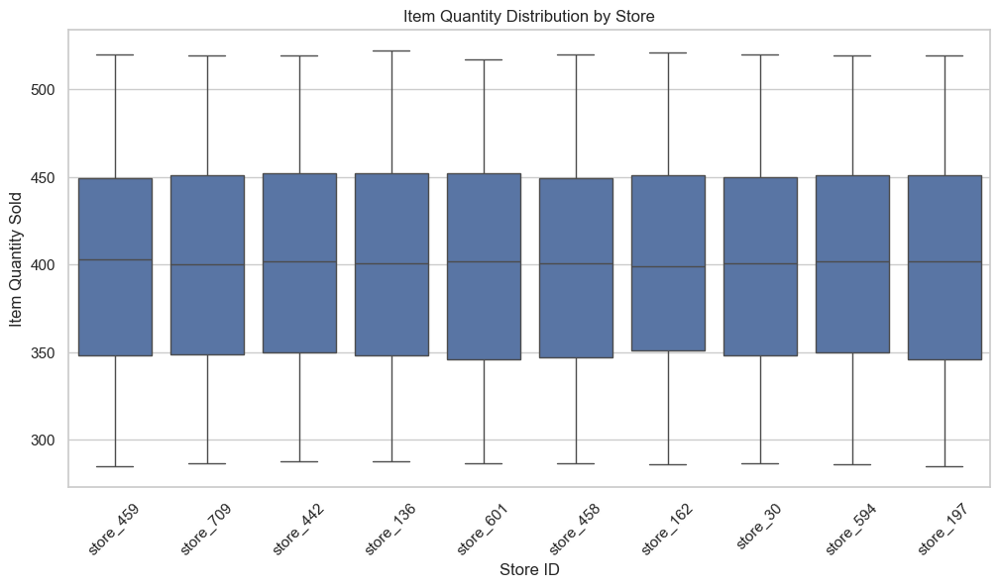

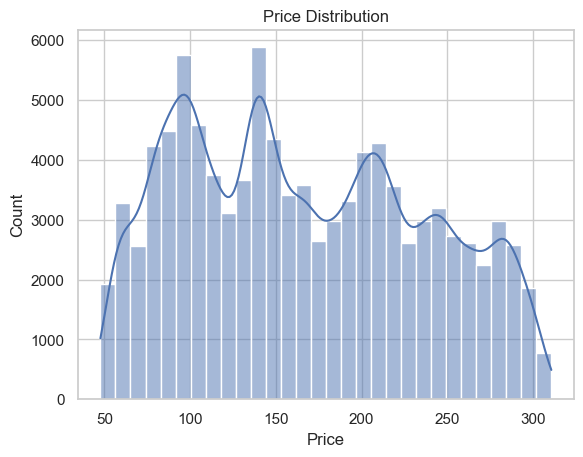

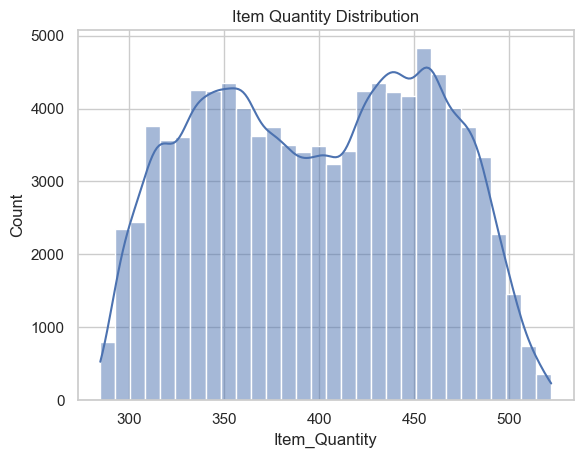

In [7]:
# Store Performance Insights: Sales and elasticity across different stores
plt.figure(figsize=(12, 6))
sns.boxplot(x='Store_ID', y='Item_Quantity', data=data)
plt.title('Item Quantity Distribution by Store')
plt.xlabel('Store ID')
plt.ylabel('Item Quantity Sold')
plt.xticks(rotation=45)
plt.show()

# Data Visualizations: Histograms for Price and Item Quantity
sns.histplot(data['Price'], bins=30, kde=True)
plt.title('Price Distribution')
plt.show()

sns.histplot(data['Item_Quantity'], bins=30, kde=True)
plt.title('Item Quantity Distribution')
plt.show()

In [8]:
# Calculate PED
data['PED'] = data['Quantity_Change'] / data['Price_Change']

# Replace infinities and drop NaNs
data.replace([float('inf'), -float('inf')], float('nan'), inplace=True)
data.dropna(subset=['PED'], inplace=True)

# Summary Statistics for PED
ped_summary = data['PED'].describe()
print(ped_summary)

count    8234.000000
mean       -0.461013
std        35.573810
min     -1455.268409
25%        -0.796818
50%         0.000000
75%         0.765515
max      1127.613636
Name: PED, dtype: float64


In [9]:
# Calculate weighted PED
data['Weighted_PED'] = data['PED'] * data['Item_Quantity'] / data['Item_Quantity'].sum()

# Replace infinities and drop NaNs
data.replace([float('inf'), -float('inf')], float('nan'), inplace=True)
data.dropna(subset=['PED'], inplace=True)

# Summary Statistics for PED
ped_summary = data['PED'].describe()
print(ped_summary)

count    8234.000000
mean       -0.461013
std        35.573810
min     -1455.268409
25%        -0.796818
50%         0.000000
75%         0.765515
max      1127.613636
Name: PED, dtype: float64


In [10]:
# Define Elasticity Thresholds
elastic_threshold = 1
inelastic_threshold = -1

# Segment the data
data['Segment'] = 'Unitary Elastic'
data.loc[data['PED'] > elastic_threshold, 'Segment'] = 'Highly Elastic'
data.loc[data['PED'] < inelastic_threshold, 'Segment'] = 'Inelastic'
data.loc[data['PED'] == 0, 'Segment'] = 'Zero Elasticity'
data.loc[data['PED'] < 0, 'Segment'] = 'Negative Elasticity'

# Count Segment Frequencies
segment_counts = data['Segment'].value_counts()
print(segment_counts)

# Dynamic Segmentation: Use quantiles for dynamic thresholds
q1 = data['PED'].quantile(0.25)
q3 = data['PED'].quantile(0.75)

# Correct the bin order
data['Dynamic_Segment'] = pd.cut(
    data['PED'], 
    bins=[-float('inf'), inelastic_threshold, q1, elastic_threshold, float('inf')],
    labels=['Very Inelastic', 'Inelastic', 'Unitary', 'Elastic']
)

Segment
Negative Elasticity    4031
Unitary Elastic        2300
Highly Elastic         1740
Zero Elasticity         163
Name: count, dtype: int64


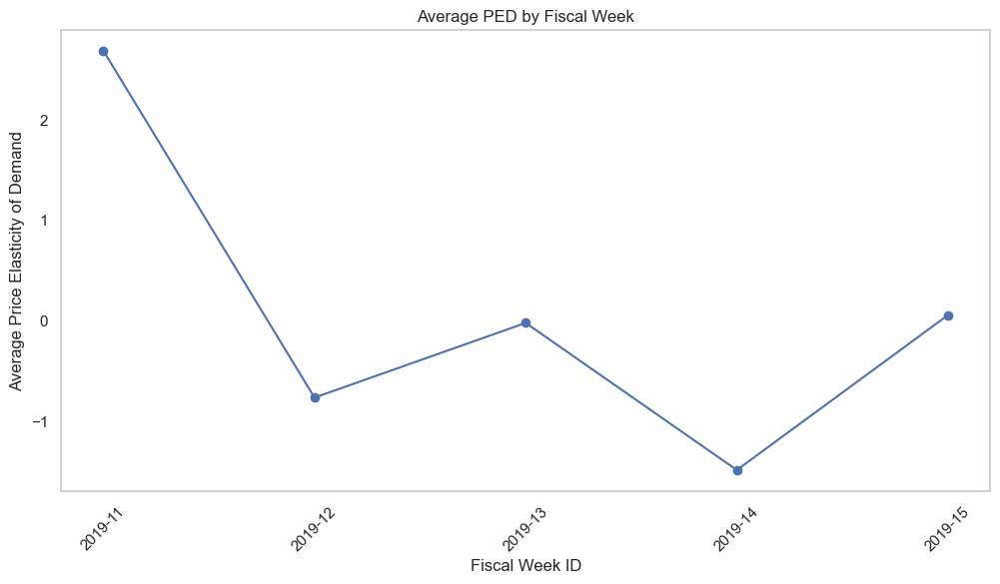

In [11]:
# Fiscal Week Analysis: Analyze how elasticity varies by Fiscal_Week_ID
weekly_ped = data.groupby('Fiscal_Week_ID')['PED'].mean().reset_index()

# Time Series Plot
plt.figure(figsize=(12, 6))
plt.plot(weekly_ped['Fiscal_Week_ID'], weekly_ped['PED'], marker='o')
plt.title('Average PED by Fiscal Week')
plt.xlabel('Fiscal Week ID')
plt.ylabel('Average Price Elasticity of Demand')
plt.xticks(rotation=45)
plt.grid()
plt.show()

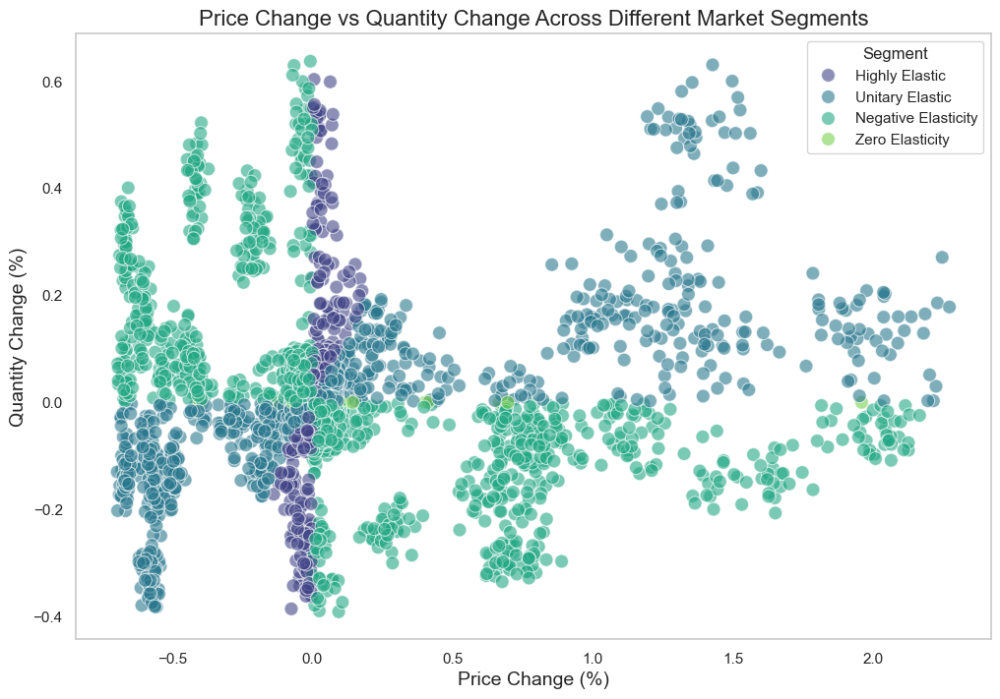

In [12]:
# Create a scatter plot of Price Change vs Quantity Change colored by Segment
plt.figure(figsize=(12, 8))
palette = sns.color_palette("viridis", as_cmap=True)  # Set a color palette

# Scatter plot
sns.scatterplot(x='Price_Change', y='Quantity_Change', hue='Segment', data=data,
                palette='viridis', alpha=0.6, s=100)

# Add titles and labels
plt.title('Price Change vs Quantity Change Across Different Market Segments', fontsize=16)
plt.xlabel('Price Change (%)', fontsize=14)
plt.ylabel('Quantity Change (%)', fontsize=14)
plt.grid()

# Show the plot
plt.legend(title='Segment')
plt.show()

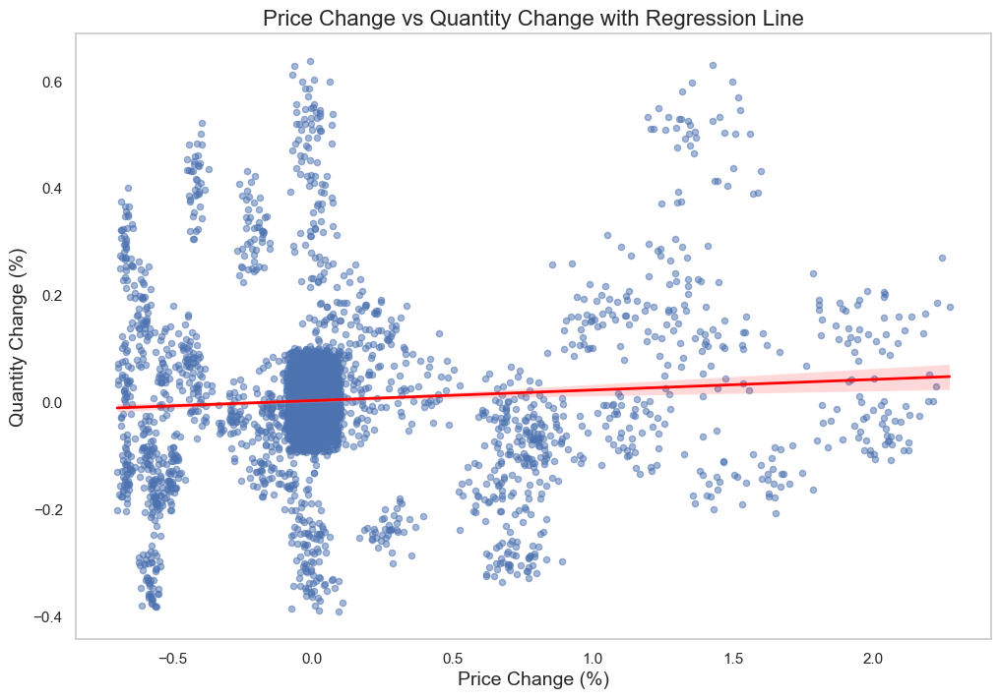

In [13]:
# Scatter Plot with Regression Line
plt.figure(figsize=(12, 8))

# Scatter plot with regression line
sns.regplot(x='Price_Change', y='Quantity_Change', data=data,
            scatter_kws={'alpha': 0.5, 's': 20},  # Adjust transparency and marker size
            line_kws={'color': 'red', 'lw': 2, 'linestyle': '-'})  # Customize line

# Add titles and labels
plt.title('Price Change vs Quantity Change with Regression Line', fontsize=16)
plt.xlabel('Price Change (%)', fontsize=14)
plt.ylabel('Quantity Change (%)', fontsize=14)
plt.grid()

# Show the plot
plt.show()

In [14]:
# Regression Analysis
X = data[['Price', 'Competition_Price']]
X = sm.add_constant(X)  # Add constant for intercept
y = data['Item_Quantity']
model = sm.OLS(y, X).fit()
print(model.summary())

# T-tests and ANOVA: Compare means across segments
segments = ['Highly Elastic', 'Inelastic', 'Unitary Elastic']
segment_data = [data[data['Segment'] == segment]['PED'] for segment in segments]

# Ensure all segments have data before performing ANOVA
if all(len(seg) > 0 for seg in segment_data):
    anova_results = stats.f_oneway(*segment_data)
    print(f'ANOVA Results: F-statistic = {anova_results.statistic}, p-value = {anova_results.pvalue}')
else:
    print("One or more segments have no data.")

                            OLS Regression Results                            
Dep. Variable:          Item_Quantity   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.027
Method:                 Least Squares   F-statistic:                     114.5
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           8.64e-50
Time:                        17:03:44   Log-Likelihood:                -45172.
No. Observations:                8234   AIC:                         9.035e+04
Df Residuals:                    8231   BIC:                         9.037e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const               422.4027      2.24

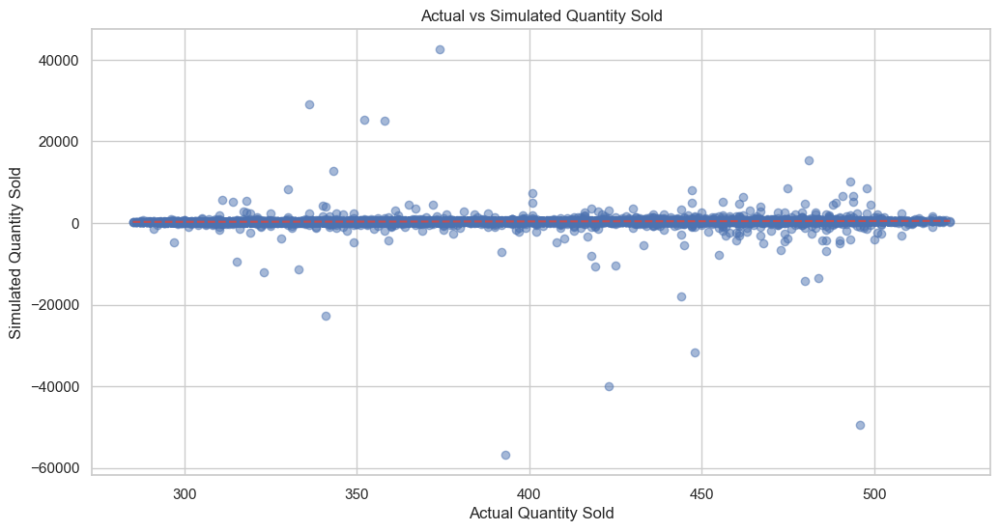

In [15]:
# Simulate Pricing Strategies: Create hypothetical scenarios
data['Simulated_Quantity'] = data['Item_Quantity'] * (1 + (data['PED'] * 0.10))  # Simulate a 10% price change

# Plot Simulated vs Actual Quantity
plt.figure(figsize=(12, 6))
plt.scatter(data['Item_Quantity'], data['Simulated_Quantity'], alpha=0.5)
plt.plot([data['Item_Quantity'].min(), data['Item_Quantity'].max()], 
         [data['Item_Quantity'].min(), data['Item_Quantity'].max()], 'r--')
plt.title('Actual vs Simulated Quantity Sold')
plt.xlabel('Actual Quantity Sold')
plt.ylabel('Simulated Quantity Sold')
plt.show()

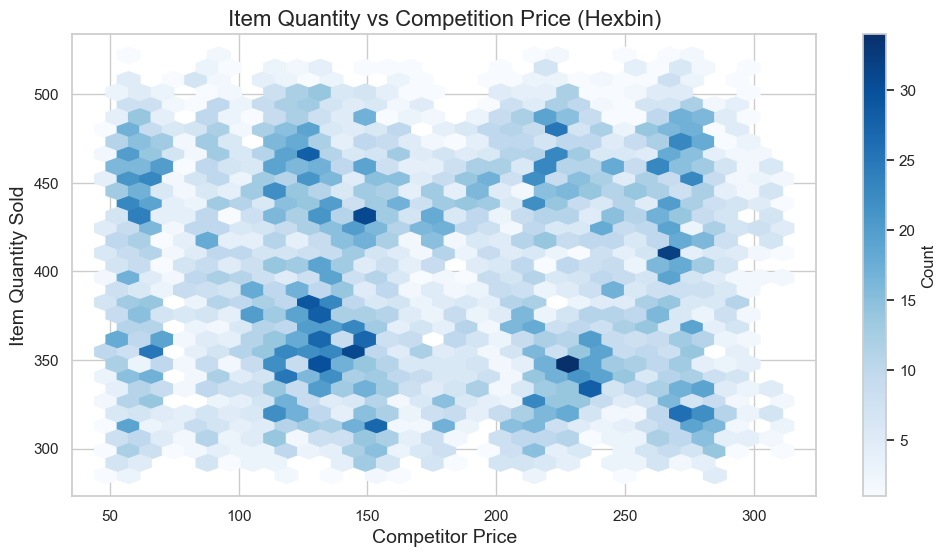

In [16]:
# Correlation with Competition
plt.figure(figsize=(12, 6))
plt.hexbin(data['Competition_Price'], data['Item_Quantity'], gridsize=30, cmap='Blues', mincnt=1)
plt.colorbar(label='Count')
plt.title('Item Quantity vs Competition Price (Hexbin)', fontsize=16)
plt.xlabel('Competitor Price', fontsize=14)
plt.ylabel('Item Quantity Sold', fontsize=14)
plt.grid(True)
plt.show()